In [99]:
from satpy import Scene, find_files_and_readers
from pyresample import create_area_def
from satpy.writers import get_enhanced_image
from datetime import datetime
import math

import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from glob import glob

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

from satpy import MultiScene
from satpy.multiscene import timeseries

%matplotlib inline
import cmocean
import cmocean.cm as cmo

from dask.diagnostics import ProgressBar
from celluloid import Camera
from IPython.display import HTML

In [46]:
# Generates a list of file names
filenames = glob('../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A20221*.hdf')
filenames.sort()
filenames

['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022107.1855.061.2022108230711.hdf',
 '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022108.1935.061.2022109155237.hdf',
 '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022108.1940.061.2022109155310.hdf',
 '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022109.1840.061.2022110163422.hdf',
 '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022109.1845.061.2022110163202.hdf',
 '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022109.2020.061.2022110163807.hdf',
 '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022110.1750.061.2022111204455.hdf',
 '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022110.1925.061.2022111204450.hdf',
 '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022111.1830.061.2022112151310.hdf',
 '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L

In [47]:
# Because of how I saved the files I have several images per day, and I will eventually want to join the mosaics
# to select all the images in a day 'clip' the day identifier (e.g. 'A2022060') from all file names
# get the unique values
swats = np.unique([f.split('.')[5] for f in filenames])
swats

array(['A2022107', 'A2022108', 'A2022109', 'A2022110', 'A2022111',
       'A2022112'], dtype='<U8')

In [55]:
## list available scenes
scn.available_dataset_names()
scn.load(scn.available_dataset_names())
scn.keys()

[DataID(name='1', wavelength=WavelengthRange(min=0.62, central=0.645, max=0.67, unit='µm'), resolution=1000, calibration=<calibration.reflectance>, modifiers=()),
 DataID(name='10', wavelength=WavelengthRange(min=0.483, central=0.488, max=0.493, unit='µm'), resolution=1000, calibration=<calibration.reflectance>, modifiers=()),
 DataID(name='11', wavelength=WavelengthRange(min=0.526, central=0.531, max=0.536, unit='µm'), resolution=1000, calibration=<calibration.reflectance>, modifiers=()),
 DataID(name='12', wavelength=WavelengthRange(min=0.546, central=0.551, max=0.556, unit='µm'), resolution=1000, calibration=<calibration.reflectance>, modifiers=()),
 DataID(name='13hi', wavelength=WavelengthRange(min=0.662, central=0.667, max=0.672, unit='µm'), resolution=1000, calibration=<calibration.reflectance>, modifiers=()),
 DataID(name='13lo', wavelength=WavelengthRange(min=0.662, central=0.667, max=0.672, unit='µm'), resolution=1000, calibration=<calibration.reflectance>, modifiers=()),
 Da

['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022108.1935.061.2022109155237.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022108.1940.061.2022109155310.hdf']


C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\pyproj\crs\crs.py:1256: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  return self._crs.to_proj4(version=version)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)


KeyboardInterrupt: 

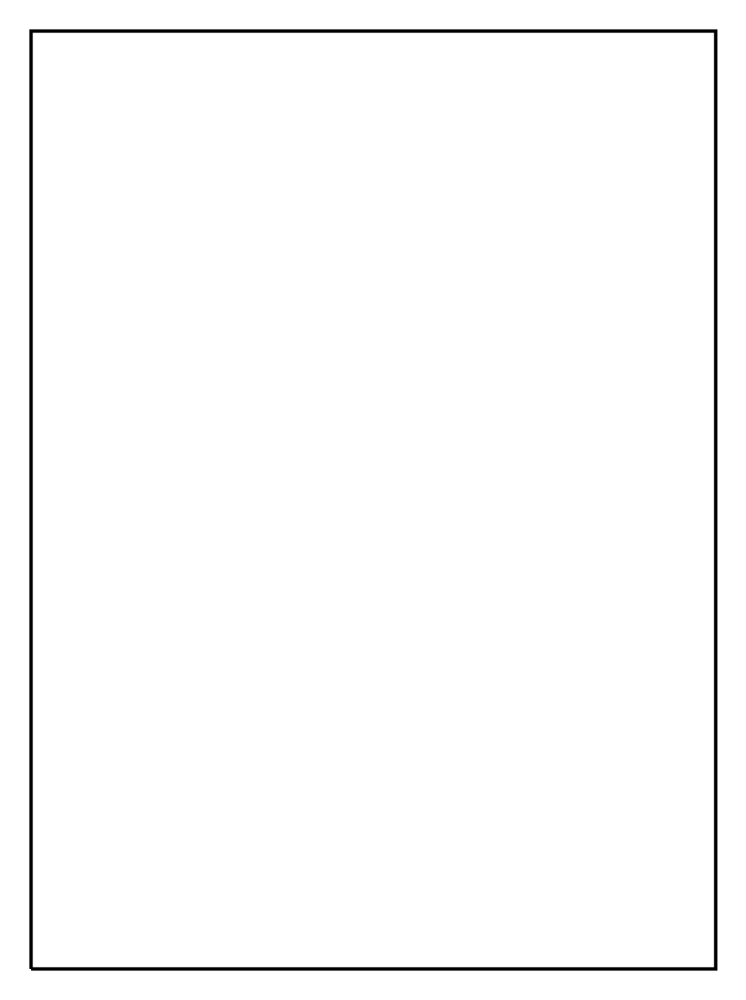

In [48]:
# lets try for one (this will plot the entire scene of the day)
i=0
base = '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.'

dayfiles = glob(base+swats[1]+'*')
print(dayfiles)
#create scene
scn = Scene(dayfiles, reader='modis_l1b')
scn.load(['10','4'])
scn.load(['true_color'])
#reproject
area_proj = {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5}
my_area = scn['10'].attrs['area'].compute_optimal_bb_area(area_proj)
new_scn = scn.resample(my_area)
#generate RGB from true color
rgb = get_enhanced_image(new_scn['true_color'])
#extract projection
crs = new_scn['true_color'].attrs['area'].to_cartopy_crs()
#make plot
fig =  plt.figure(figsize=(6, 4), dpi=400)
ax1 = plt.subplot(projection=crs)
rgb.data.plot.imshow(rgb='bands', transform=crs, ax=ax1)
ax1.set_title('MODISA_%s' % new_scn.start_time.isoformat())
#save figure
#fig.savefig('MODISA_%s_rgb.png' % new_scn.start_time.isoformat())

In [ ]:
# make them all
base = '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.'
# loop over unique days
for swat in swats:
    #load
    dayfiles = glob(base+swat+'*')
    scn = Scene(dayfiles, reader='modis_l1b')
    scn.load(['10','4'])
    scn.load(['true_color'])
    #project
    area_proj = {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5}
    my_area = scn['10'].attrs['area'].compute_optimal_bb_area(area_proj)
    new_scn = scn.resample(my_area)
    #generate RGB from true color
    rgb = get_enhanced_image(new_scn['true_color'])
    #extract projection
    crs = new_scn['true_color'].attrs['area'].to_cartopy_crs()
    #make the figure
    fig =  plt.figure(figsize=(6, 4), dpi=400)
    ax1 = plt.subplot(projection=crs)
    rgb.data.plot.imshow(rgb='bands', transform=crs, ax=ax1)
    #set title with date
    ax1.set_title('MODISA_%s' % new_scn.start_time.isoformat())
    #save figure (.png) with date in filename
    #fig.savefig('MODISA_%s_rgb.png' % new_scn.start_time.isoformat())

In [ ]:
# lets try projecting to a fixed area (instead of automatic optimized)
i=0
dayfiles = glob(base+swats[i]+'*')
print(dayfiles)
#create scene
scn = Scene(dayfiles, reader='modis_l1b')
scn.load(['10','4'])
scn.load(['true_color'])
#reprpject
my_area = create_area_def('my_area', {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5},
                          width=1500, height=750,
                          area_extent=[-94, 27.5, -88, 30.5], units='degrees')
new_scn = scn.resample(my_area)
#generate RGB from true color
rgb = get_enhanced_image(new_scn['true_color'])

#extract projection and lon lat from products
crs = new_scn['true_color'].attrs['area'].to_cartopy_crs()

fig =  plt.figure(figsize=(6, 4), dpi=400)
ax1 = plt.subplot(projection=crs)
rgb.data.plot.imshow(rgb='bands', transform=crs, ax=ax1)
ax1.set_title('MODISA_Mdelta_%s' % new_scn.start_time.isoformat())
#fig.savefig('MODISA_Mdelta_%s_rgb.png' % new_scn.start_time.isoformat())

In [ ]:
#lets do the loop
for swat in swats:
    dayfiles = glob(base+swat+'*')

    print(dayfiles)
    #create scene
    scn = Scene(dayfiles, reader='modis_l1b')
    scn.load(['10','4'])
    scn.load(['true_color'])
    #reprpject
    my_area = create_area_def('my_area', {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5},
                              width=1500, height=750,
                              area_extent=[-94, 27.5, -88, 30.5], units='degrees')
    new_scn = scn.resample(my_area)
    #generate RGB from true color
    rgb = get_enhanced_image(new_scn['true_color'])

    #extract projection and lon lat from products
    crs = new_scn['true_color'].attrs['area'].to_cartopy_crs()

    fig =  plt.figure(figsize=(6, 4), dpi=400)
    ax1 = plt.subplot(projection=crs)
    rgb.data.plot.imshow(rgb='bands', transform=crs, ax=ax1)
    ax1.set_title('MODISA_Mdelta_%s' % new_scn.start_time.isoformat())
    #fig.savefig('MODISA_Mdelta_%s_rgb.png' % new_scn.start_time.isoformat())

['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022107.1855.061.2022108230711.hdf']


C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\xarray\core\computation.py:727: RuntimeWarning: invalid value encountered in logaddexp
  result_data = func(*input_data)


Text(0.5, 1.0, 'aCDOM355')

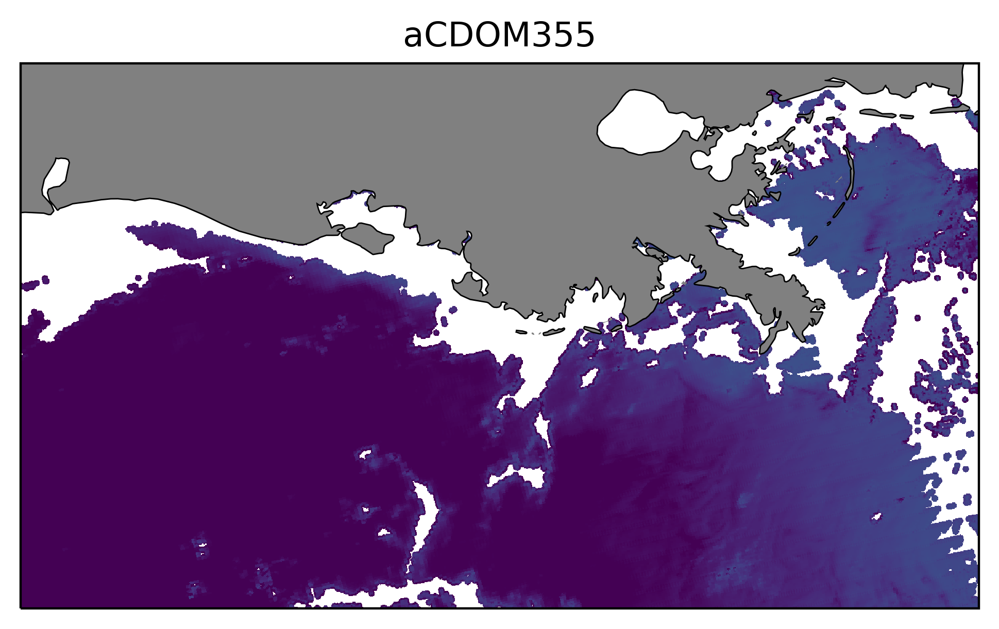

In [118]:
#lets make a 'double'
i=0
dayfiles = glob(base+swats[i]+'*')
print(dayfiles)
extent=[-94, 27.5, -88, 30.5]
res = '10m'

#load scene
scn = Scene(dayfiles, reader='modis_l1b')
scn.load(['10','4', '11','9','13hi','13lo'])
scn.load(['true_color'])

#reproject
my_area = create_area_def('my_area', {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5},
                          width=1500, height=750,
                          area_extent=extent, units='degrees')
new_scn = scn.resample(my_area)

#generate RGB from true color
rgb = get_enhanced_image(new_scn['true_color'])

#calculate aCDOM 412
A = 0.472; B = 1.48; C = 4.64
aCDOM412 = (np.log((new_scn['10']/new_scn['4'] - A)/ B))/(-C)
aCDOM412 = aCDOM412.compute()

Rss443 = np.log(new_scn['9'])
Rss448 = np.log(new_scn['10'])
Rss531 = np.log(new_scn['11'])
Rss555 = np.log(new_scn['4'])
Rss667 = np.log(new_scn['13lo'])

#calculate aCDOM 300
aCDOM300 = (-0.0206*Rss443) + (-0.6128*Rss448) + (-0.0070*Rss531) + (-0.4944*Rss555) + (0.9362*Rss667) + (.9666)
aCDOM300 = aCDOM300.compute()

#calculate aCDOM 355
aCDOM355 = (0.0376*Rss443) + (-0.8714*Rss448) +(-0.0352*Rss531) + (-0.2739*Rss555) + (0.9591*Rss667) + (-0.1071)
aCDOM355 = aCDOM355.compute()

#calculate aCDOM SS 275-295
aCDOMss = (-0.0537*Rss443) + (0.2689*Rss448) + (0.1017*Rss531) + (-0.2097*Rss555) + (-0.0893*Rss667) + (-3.6853)
aCDOMss = aCDOMss.compute()

#calculate DOC
#TERM1 = 33.95*aCDOMss
TERM2 = (-15.05)-(33.95*aCDOMss)
#TERM3 = math.e**(TERM2)

#TERM4 = 104.3*aCDOMss
TERM5 = (-1.502)-(04.3*aCDOMss)
#TERM6 = np.exp(TERM5)

# np.logaddexp Calculates log(exp(x1) + exp(x2))
TERM = np.logaddexp(TERM2, TERM5)

DOC = aCDOM300/(TERM) 
DOC = DOC.compute()


fig =  plt.figure(figsize=(6, 4), dpi=400)
trim = aCDOM355.max().values
ax1 = plt.subplot(1, 1, 1, projection=crs)
ax1.coastlines(res)
ax1.pcolormesh(lons, lats, aCDOM355.where(aCDOM355<=trim), transform=ccrs.PlateCarree(),
              vmax = aCDOM300.max().values, vmin= aCDOM300.min().values)
ax1.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                            name='land', facecolor='grey',
                                            scale=res))
ax1.set_title('aCDOM355')


#fig.savefig('../outputs/test2.png')

In [145]:
aCDOM412.min().values

array(0.04088368, dtype=float32)

['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022107.1855.061.2022108230711.hdf']


C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\xarray\core\computation.py:727: RuntimeWarning: invalid value encountered in logaddexp
  result_data = func(*input_data)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or 

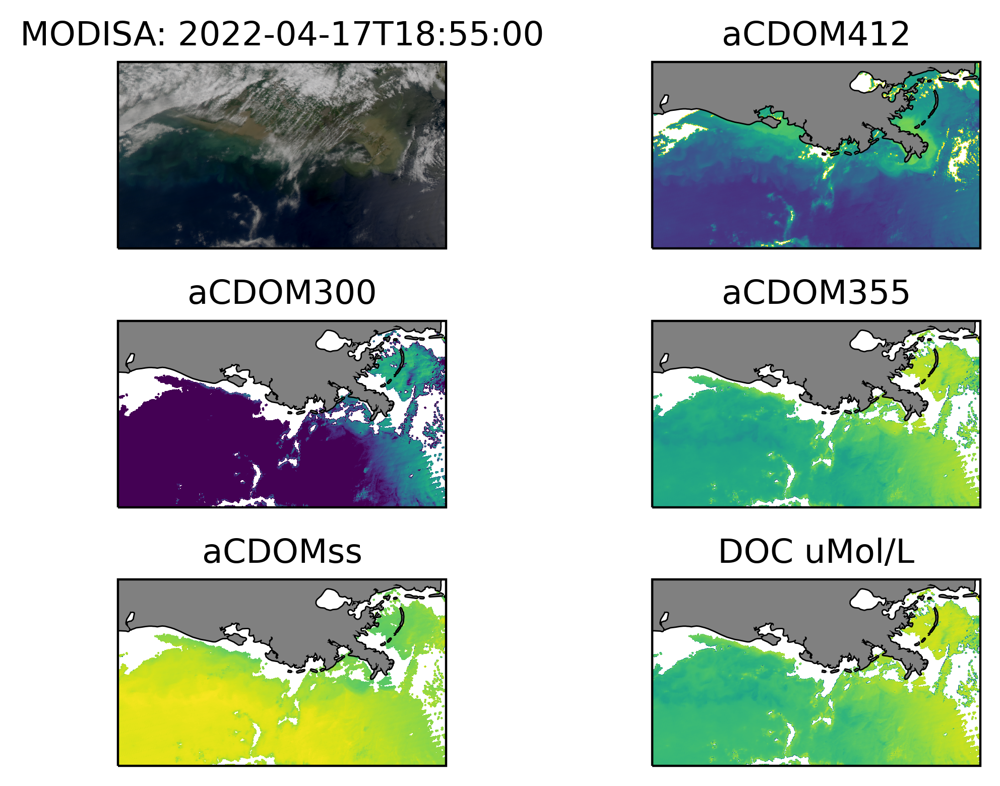

In [151]:
#lets make a 'double'
i=0
dayfiles = glob(base+swats[i]+'*')
print(dayfiles)
extent=[-94, 27.5, -88, 30.5]
res = '10m'

#load scene
scn = Scene(dayfiles, reader='modis_l1b')
scn.load(['10','4', '11','9','13lo'])
scn.load(['true_color'])

#reproject
my_area = create_area_def('my_area', {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5},
                          width=1500, height=750,
                          area_extent=extent, units='degrees')
new_scn = scn.resample(my_area)

#generate RGB from true color
rgb = get_enhanced_image(new_scn['true_color'])

#calculate aCDOM 412
A = 0.472; B = 1.48; C = 4.64
aCDOM412 = (np.log((new_scn['10']/new_scn['4'] - A)/ B))/(-C)
aCDOM412 = aCDOM412.compute()

Rss443 = np.log(new_scn['9'])
Rss448 = np.log(new_scn['10'])
Rss531 = np.log(new_scn['11'])
Rss555 = np.log(new_scn['4'])
Rss667 = np.log(new_scn['13lo'])

#calculate aCDOM 300
aCDOM300 = (-0.0206*Rss443) + (-0.6128*Rss448) + (-0.0070*Rss531) + (-0.4944*Rss555) + (0.9362*Rss667) + (.9666)
aCDOM300 = aCDOM300.compute()

#calculate aCDOM 355
aCDOM355 = (0.0376*Rss443) + (-0.8714*Rss448) +(-0.0352*Rss531) + (-0.2739*Rss555) + (0.9591*Rss667) + (-0.1071)
aCDOM355 = aCDOM355.compute()

#calculate aCDOM SS 275-295
aCDOMss = (-0.0537*Rss443) + (0.2689*Rss448) + (0.1017*Rss531) + (-0.2097*Rss555) + (-0.0893*Rss667) + (-3.6853)
aCDOMss = aCDOMss.compute()

#calculate DOC
#DOC = aCDOM300 / ((np.exp(-15.05-(33.95*aCDOMss)))+(np.exp(-1.502-(104.3*aCDOMss)))) 
TERM1 = (-15.05-(33.95*aCDOMss))
TERM2 = (-1.502-(04.3*aCDOMss))
# np.logaddexp Calculates log(exp(x1) + exp(x2))
TERM = np.logaddexp(TERM1, TERM2)
DOC = aCDOM300/(TERM) 
DOC = DOC.compute()

#extract projection and lon lat from products
crs = new_scn['true_color'].attrs['area'].to_cartopy_crs()
lons, lats = new_scn['true_color'].attrs['area'].get_lonlats()

#set up figure size and resolution
fig =  plt.figure(figsize=(6, 4), dpi=400)

# true color
ax1 = plt.subplot(3, 2, 1, projection=crs)
rgb.data.plot.imshow(rgb='bands', transform=crs, ax=ax1)
ax1.set_title('MODISA: %s' % new_scn.start_time.isoformat())

# aCDOM 412 
trim = aCDOM412.max().values
ax2 = plt.subplot(3, 2, 2, projection=crs)
ax2.coastlines(res)
ax2.pcolormesh(lons, lats, aCDOM412.where(aCDOM412<=trim), transform=ccrs.PlateCarree(),
              vmin=.01, vmax=.3)
ax2.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                            name='land', facecolor='grey',
                                            scale=res))
ax2.set_title('aCDOM412')

# aCDOM 300
trim = aCDOM300.max().values
ax3 = plt.subplot(3, 2, 3, projection=crs)
ax3.coastlines(res)
ax3.pcolormesh(lons, lats, aCDOM300.where(aCDOM300<=trim), transform=ccrs.PlateCarree(),
              vmin=.0, vmax=.3)
ax3.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                            name='land', facecolor='grey',
                                            scale=res))
ax3.set_title('aCDOM300')

# aCDOM 355
trim = aCDOM355.max().values
ax4 = plt.subplot(3, 2, 4, projection=crs)
ax4.coastlines(res)
ax4.pcolormesh(lons, lats, aCDOM355.where(aCDOM355<=trim), transform=ccrs.PlateCarree())
ax4.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                            name='land', facecolor='grey',
                                            scale=res))
ax4.set_title('aCDOM355')

# aCDOMss
trim = aCDOMss.max().values
ax5 = plt.subplot(3, 2, 5, projection=crs)
ax5.coastlines(res)
ax5.pcolormesh(lons, lats, aCDOMss.where(aCDOMss<=trim), transform=ccrs.PlateCarree())
ax5.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                            name='land', facecolor='grey',
                                            scale=res))
ax5.set_title('aCDOMss')

# DOC 
trim = DOC.max().values
ax6 = plt.subplot(3, 2, 6, projection=crs)
ax6.coastlines(res)
ax6.pcolormesh(lons, lats, DOC.where(DOC<=trim), transform=ccrs.PlateCarree())
ax6.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                            name='land', facecolor='grey',
                                            scale=res))
ax6.set_title('DOC uMol/L')

#optimize spacing between plots
fig.tight_layout()
#save
fig.savefig('../outputs/test2.png')

In [148]:
aCDOM412.mean().values

array(0.13245684, dtype=float32)

['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022107.1855.061.2022108230711.hdf']


C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022108.1935.061.2022109155237.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022108.1940.061.2022109155310.hdf']


C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022109.1840.061.2022110163422.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022109.1845.061.2022110163202.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022109.2020.061.2022110163807.hdf']


C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022110.1750.061.2022111204455.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022110.1925.061.2022111204450.hdf']


C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
Clipping input data to the valid range for imshow with RGB data ([0..1] for float

['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022111.1830.061.2022112151310.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022111.2010.061.2022112151909.hdf']


C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)


['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022112.1910.061.2022113153618.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022112.1915.061.2022113153636.hdf']


C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in arccos
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\satpy\modifiers\angles.py:407: RuntimeWarning: invalid value encountered in log
  grad_factor = 1. - np.log(grad_factor + 1) / np.log(2)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


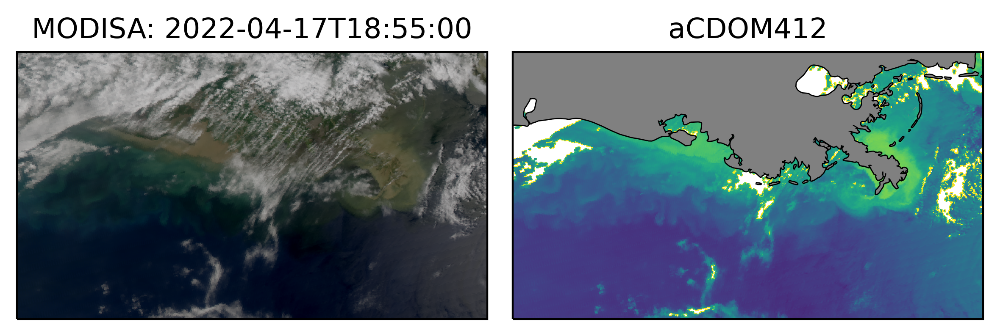

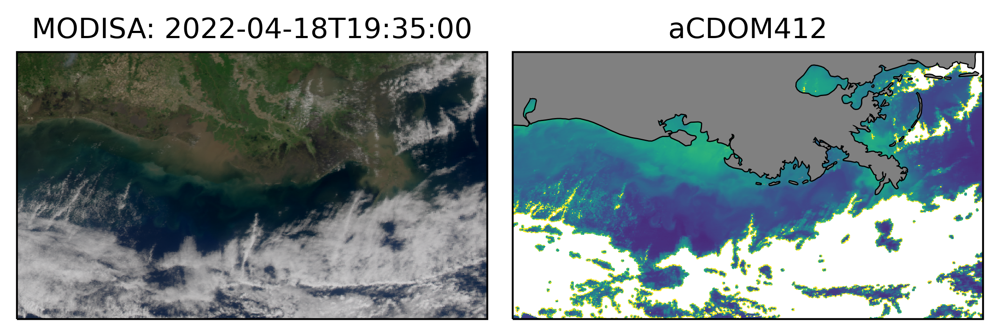

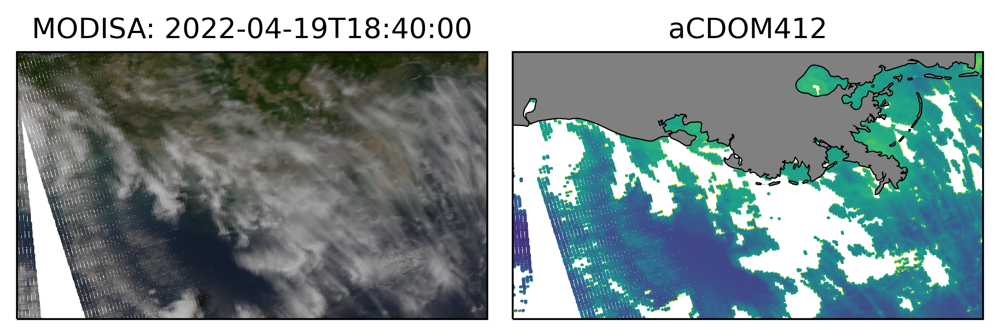

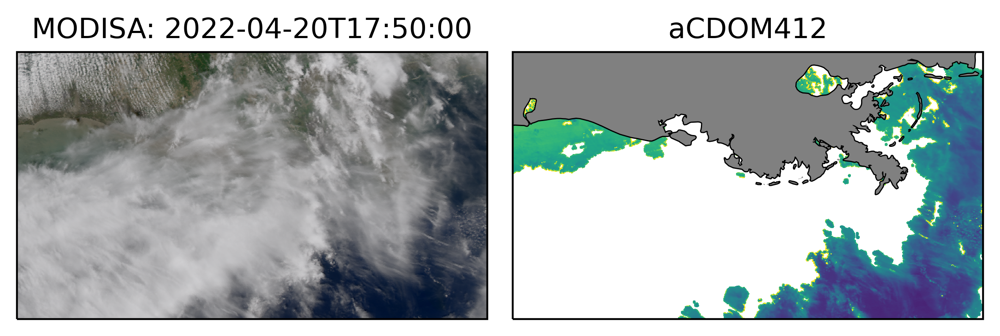

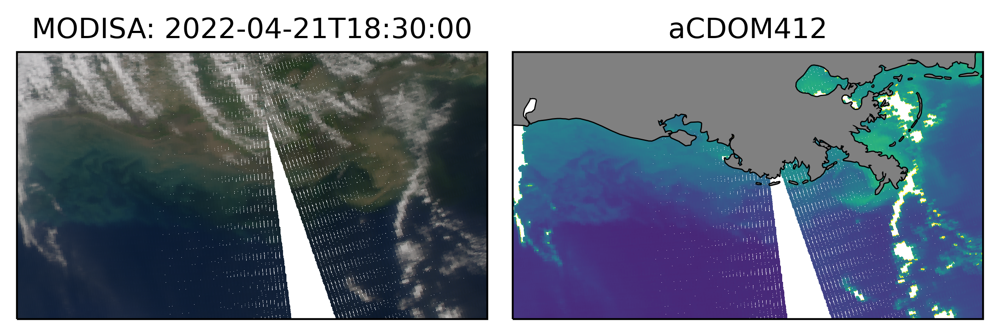

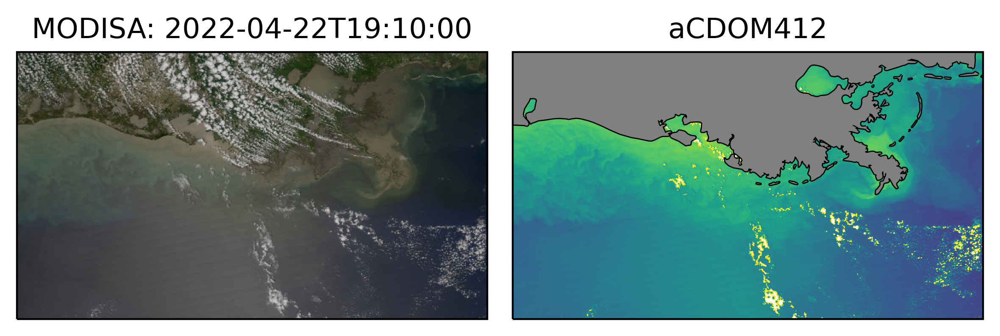

In [9]:
## IMPLEMENT THIS ONE!!!!


#create area once
my_area = create_area_def('my_area', {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5},
                          width=1500, height=750,
                          area_extent=[-94, 27.5, -88, 30.5], units='degrees')
#constants
A = 0.472; B = 1.48; C = 4.64
    
for swat in swats:
    dayfiles = glob(base+swat+'*')
    print(dayfiles)
    scn = Scene(dayfiles, reader='modis_l1b')
    scn.load(['10','4'])
    scn.load(['true_color'])

    #reproject
    new_scn = scn.resample(my_area)

    #generate RGB from true color
    rgb = get_enhanced_image(new_scn['true_color'])

    #calculate aCDOM
    aCDOM412 = (np.log((new_scn['10']/new_scn['4'] - A)/ B))/(-C)
    aCDOM412 = aCDOM412.compute()

    #extract projection and lon lat from products
    crs = new_scn['true_color'].attrs['area'].to_cartopy_crs()
    lons, lats = new_scn['true_color'].attrs['area'].get_lonlats()

    #set up figure size and resolution
    fig =  plt.figure(figsize=(6, 4), dpi=400)

    #left true color
    ax1 = plt.subplot(1, 2, 1, projection=crs)
    rgb.data.plot.imshow(rgb='bands', transform=crs, ax=ax1)
    ax1.set_title('MODISA: %s' % new_scn.start_time.isoformat())

    #right aCDOM
    trim = aCDOM412.max().values
    ax2 = plt.subplot(1, 2, 2, projection=crs)
    #costline with specified resolution
    ax2.coastlines(res)
    #this is ploting x,y, aCDOM
    ax2.pcolormesh(lons, lats, aCDOM412.where(aCDOM412<=trim), transform=ccrs.PlateCarree(),
                  vmin=.01, vmax=.3)
    #mask the land
    ax2.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                                name='land', facecolor='grey',
                                                scale=res))
    ax2.set_title('aCDOM412')
    #optimize spacing between plots
    fig.tight_layout()
    #save

fig.savefig('../outputs/MODISA_%s_rgb_cdom.png')

C:\Users\12532\miniconda3\envs\Bugs\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))


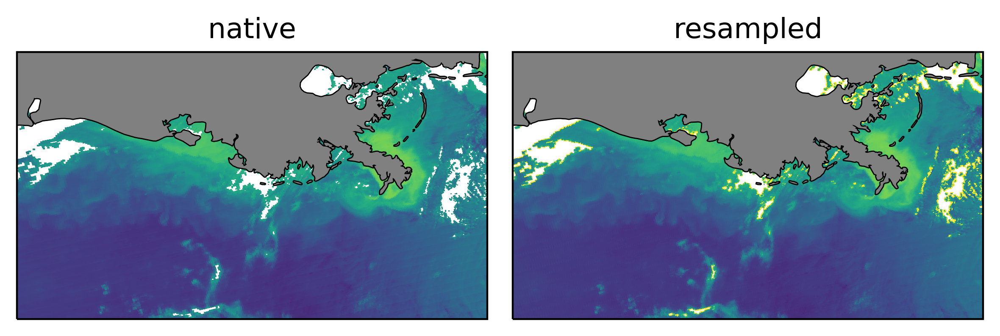

In [10]:
# test to understand the effect of resampling (interpolation)
#on aCDOM calculation

i=0
dayfiles = glob(base+swats[i]+'*')
scn = Scene(dayfiles, reader='modis_l1b')
scn.load(['10','4'])

#reproject
my_area = create_area_def('my_area', {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5},
                          width=1500, height=750,
                          area_extent=extent, units='degrees')
new_scn = scn.resample(my_area)

#calculate aCDOM
A = 0.472; B = 1.48; C = 4.64
aCDOM412 = (np.log((scn['10']/scn['4'] - A)/ B))/(-C)
aCDOM412 = aCDOM412.compute()

aCDOM412_r = (np.log((new_scn['10']/new_scn['4'] - A)/ B))/(-C)
aCDOM412_r = aCDOM412_r.compute()


# crs1 = scn['10'].attrs['area'].to_cartopy_crs()
crs2 = new_scn['10'].attrs['area'].to_cartopy_crs()
lons1, lats1 = scn['10'].attrs['area'].get_lonlats()
lons2, lats2 = new_scn['10'].attrs['area'].get_lonlats()

fig =  plt.figure(figsize=(6, 4), dpi=400)
extent=[-94, -88, 27.5, 30.5]
ax1 = plt.subplot(1, 2, 1, projection=crs2)
ax1.coastlines(res)
ax1.set_extent(extent)
ax1.pcolormesh(lons1, lats1, aCDOM412, transform=ccrs.PlateCarree(),
              vmin=.01, vmax=.3)
ax1.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                            name='land', facecolor='grey',
                                            scale=res))
ax1.set_title('native')

ax2 = plt.subplot(1, 2, 2, projection=crs2)
ax2.coastlines(res)
ax2.set_extent(extent)
ax2.pcolormesh(lons2, lats2, aCDOM412_r, transform=ccrs.PlateCarree(),
              vmin=.01, vmax=.3)
ax2.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                            name='land', facecolor='grey',
                                            scale=res))
ax2.set_title('resampled')


fig.tight_layout()

In [11]:
import warnings
warnings.filterwarnings('ignore')
ax1.annotate(new_scn.start_time.isoformat("|"), (75000,90000), color='black', fontsize=5) #Top Right

Text(75000, 90000, '2022-04-17|18:55:00')

['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022107.1855.061.2022108230711.hdf']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022108.1935.061.2022109155237.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022108.1940.061.2022109155310.hdf']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022109.1840.061.2022110163422.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022109.1845.061.2022110163202.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022109.2020.061.2022110163807.hdf']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022110.1750.061.2022111204455.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022110.1925.061.2022111204450.hdf']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022111.1830.061.2022112151310.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022111.2010.061.2022112151909.hdf']
['../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022112.1910.061.2022113153618.hdf', '../../SAT_DATA/HDF/MODIS_AQUA_APR-2_APR-22_2022_HDF_L1\\MYD021KM.A2022112.1915.061.2022113153636.hdf']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


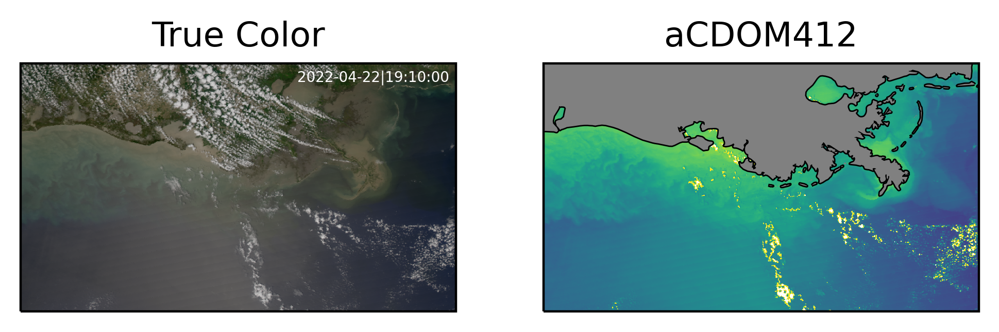

In [12]:
res = '10m'
extent=[-94, 27.5, -88, 30.5]

#Define Camera & Figure
fig =  plt.figure(figsize=(6, 2), dpi=400)
camera = Camera(fig)

#constants
A = 0.472; B = 1.48; C = 4.64

my_area = create_area_def('my_area', {'proj': 'lcc', 'lon_0': -91., 'lat_0': 29.5, 'lat_1': 29.5, 'lat_2': 29.5},
                          width=1500, height=750,
                          area_extent=extent, units='degrees')
    
for swat in swats:
    dayfiles = glob(base+swat+'*')
    print(dayfiles)
    scn = Scene(dayfiles, reader='modis_l1b')
    scn.load(['10','4'])
    scn.load(['true_color'])

    #reproject
    new_scn = scn.resample(my_area)

    #generate RGB from true color
    rgb = get_enhanced_image(new_scn['true_color'])

    #calculate aCDOM
    aCDOM412 = (np.log((new_scn['10']/new_scn['4'] - A)/ B))/(-C)
    aCDOM412 = aCDOM412.compute()

    #extract projection and lon lat from products
    crs = new_scn['true_color'].attrs['area'].to_cartopy_crs()
    lons, lats = new_scn['true_color'].attrs['area'].get_lonlats()

    #left true color
    ax1 = plt.subplot(1, 2, 1, projection=crs)
    rgb.data.plot.imshow(rgb='bands', transform=crs, ax=ax1)
    ax1.set_title('True Color')
    ax1.annotate(new_scn.start_time.isoformat("|"), (75000,90000), color='white', fontsize=5) #Top Right
    
    #right aCDOM
    trim = aCDOM412.max().values
    ax2 = plt.subplot(1, 2, 2, projection=crs)
    #costline with specified resolution
    ax2.coastlines(res)
    #this is ploting x,y, aCDOM
    ax2.pcolormesh(lons, lats, aCDOM412.where(aCDOM412<=trim), transform=ccrs.PlateCarree(),
                  vmin=.01, vmax=.3)
    #mask the land
    ax2.add_feature(cfeature.NaturalEarthFeature(category='physical', 
                                                name='land', facecolor='grey',
                                                scale=res))
    ax2.set_title('aCDOM412')
    
    #Add frame
    camera.snap()

#Create animation & Display embedded animation
animation = camera.animate(interval = 1000)
HTML(animation.to_jshtml())
animation.save('MODIS_Animation_GOM22SP.mp4')

In [13]:
animation.save('../MAPS_Figures/MODIS_Animation_GOM22SP.mp4')

MovieWriter stderr:
../MAPS_Figures/MODIS_Animation_GOM22SP.mp4: No such file or directory



CalledProcessError: Command '['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '2400x800', '-pix_fmt', 'rgba', '-r', '1.0', '-loglevel', 'error', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '../MAPS_Figures/MODIS_Animation_GOM22SP.mp4']' returned non-zero exit status 1.